In [10]:
# Import required libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models

import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os
import glob
from pathlib import Path
import json
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

from huggingface_hub import login
#login()

Using device: cpu


Prepare dataset

In [ ]:
# run next to prepare the dataset to training and validation 
# !/data/aronow/Peixin/env/segtorch/bin/python3 scripts/prepare_bccd.py --data_root "data/bccd/raw/ Dataset with mask" --out_root data/bccd --val_frac 0.15 --seed 42

Train model

In [ ]:
# training
#### YOU NEED TO DOWNLOAD THE MODEL WEIGHTS FIRST AND REPLACE THE "local_dir "IN THE ./model/uni_backbone.py 
### Model link https://huggingface.co/MahmoodLab/UNI 
!python3 train.py \
  --data_root data/bccd \
  --backbone uni \
  --img_size 512 \
  --batch_size 8 \
  --epochs 50 \
  --lr_head 1e-4 \
  --lr_backbone 1e-5 \
  --freeze_backbone_epochs 5 \
  --stain_norm reinhard \
  --augment strong \
  --out_dir runs/exp001




evaluation

In [ ]:
/env/segtorch/bin/python3 eval.py \
  --data_root data/bccd \
  --checkpoint runs/exp001/checkpoints/best.pt \
  --stain_norm reinhard \
  --split test \
  --img_size 512 \
  --out_dir runs/exp001/eval_test \
  --pp_thr 0.5 --pp_w_boundary 1 --pp_min_area 20

# Next important data dir: 
data_root : Your data root directory which contains raw/ folder and reference_lab.png and split/ folder which contains train.json and val.json and test.json.
ckpt_dir: Your checkpoint directory which contains the trained model weights.


Dataset exploration

In [ ]:
# Dataset paths
data_root = "data/bccd/uni_cellseg/data/bcdd/"
raw_data_dir = os.path.join(data_root, "raw")
train_images_dir = os.path.join(raw_data_dir, "train", "original")
train_masks_dir = os.path.join(raw_data_dir, "train", "mask")
test_images_dir = os.path.join(raw_data_dir, "test", "original")
test_masks_dir = os.path.join(raw_data_dir, "test", "mask")

# Get file lists
train_images = sorted(glob.glob(os.path.join(train_images_dir, "*")))
train_masks = sorted(glob.glob(os.path.join(train_masks_dir, "*")))
test_images = sorted(glob.glob(os.path.join(test_images_dir, "*")))
test_masks = sorted(glob.glob(os.path.join(test_masks_dir, "*")))

print(f"Training images: {len(train_images)}")
print(f"Training masks: {len(train_masks)}")
print(f"Test images: {len(test_images)}")
print(f"Test masks: {len(test_masks)}")

# Verify file correspondence
def verify_file_correspondence(images, masks):
    """Verify that image and mask files correspond by filename"""
    image_names = [os.path.basename(f).split('.')[0] for f in images]
    mask_names = [os.path.basename(f).split('.')[0] for f in masks]
    
    missing_masks = set(image_names) - set(mask_names)
    missing_images = set(mask_names) - set(image_names)
    
    if missing_masks:
        print(f"Missing masks for {len(missing_masks)} images")
    if missing_images:
        print(f"Missing images for {len(missing_images)} masks")
    
    return len(missing_masks) == 0 and len(missing_images) == 0

print("Verifying file correspondence:")
print(f"Train set: {verify_file_correspondence(train_images, train_masks)}")
print(f"Test set: {verify_file_correspondence(test_images, test_masks)}")

Training images: 1169
Training masks: 1169
Test images: 159
Test masks: 159
Verifying file correspondence:
Train set: True
Test set: True


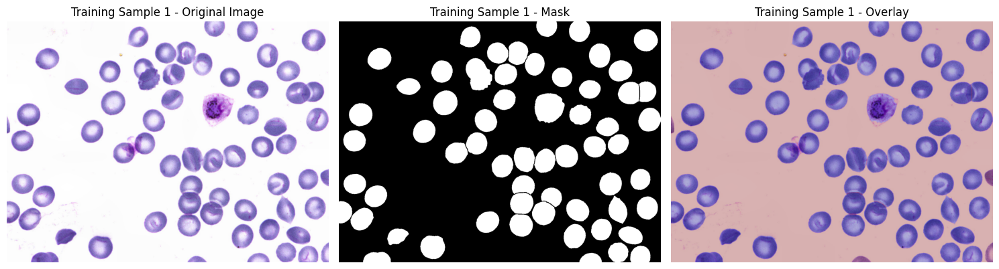

Image shape: (1200, 1600, 3)
Mask shape: (1200, 1600)
Mask unique values: [  0 255]
Number of instances: 1


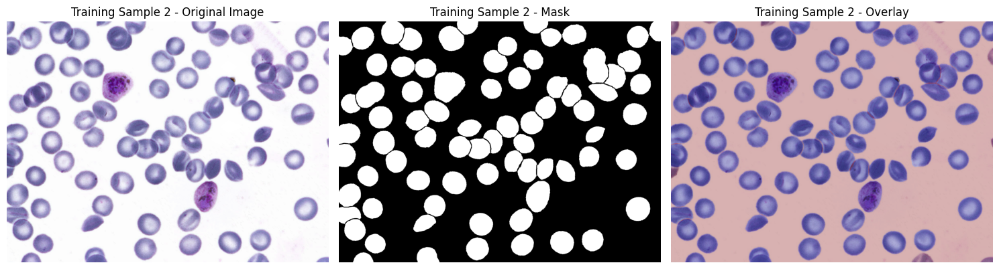

Image shape: (1200, 1600, 3)
Mask shape: (1200, 1600)
Mask unique values: [  0 255]
Number of instances: 1


In [11]:
# Visualize sample images and masks
def visualize_sample(image_path, mask_path, title="Sample"):
    """Visualize a sample image and its corresponding mask"""
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(image)
    axes[0].set_title(f'{title} - Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title(f'{title} - Mask')
    axes[1].axis('off')
    
    # Overlay mask on image
    overlay = image.copy()
    colored_mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(overlay, 0.7, colored_mask, 0.3, 0)
    axes[2].imshow(overlay)
    axes[2].set_title(f'{title} - Overlay')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Image shape: {image.shape}")
    print(f"Mask shape: {mask.shape}")
    print(f"Mask unique values: {np.unique(mask)}")
    print(f"Number of instances: {len(np.unique(mask)) - 1}")  # Exclude background (0)

# Visualize a few samples
for i in range(2):
    visualize_sample(train_images[i], train_masks[i], f"Training Sample {i+1}")


test_stain_normalization

Exists: True
Read: True
Shape: (256, 256, 3)


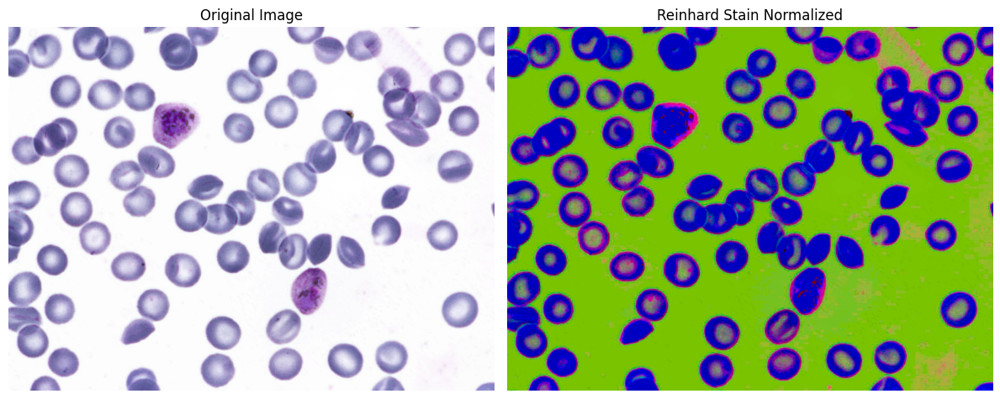

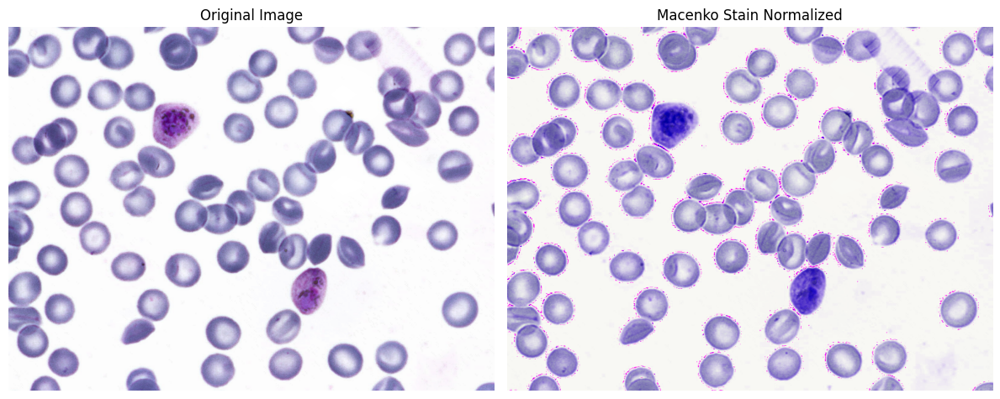

In [ ]:

from data.bccd import load_reference_lab, BCCDDataset
from data.transforms import ReinhardNormalizer, macenko_normalize, to_uint8
def test_stain_normalization(sample_image_path, method="reinhard", reference_lab_path=None):
    """
    Test stain normalization on a sample image.

    sample_image_path : str
        Path to the image to normalize
    method : str
        "reinhard" or "macenko"
    reference_lab_path : str
        Required if using "reinhard"
    """
    # Load image
    img_bgr = cv2.imread(sample_image_path, cv2.IMREAD_COLOR)
    if img_bgr is None:
        raise FileNotFoundError(f"Cannot read {sample_image_path}")
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Apply stain normalization
    if method.lower() == "reinhard":
        if reference_lab_path is None:
            raise ValueError("Reference LAB image required for Reinhard normalization")
        reference_lab = load_reference_lab(reference_lab_path)
        normalizer = ReinhardNormalizer.from_reference_lab(reference_lab)
        normalized = normalizer(img_rgb)
    elif method.lower() == "macenko":
        normalized = macenko_normalize(img_rgb)
    else:
        raise ValueError(f"Unknown stain normalization method: {method}")

    # Visualize results
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(img_rgb)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(normalized)
    axes[1].set_title(f"{method.capitalize()} Stain Normalized")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

#reference dir is data root + reference_lab.png
reference_dir = os.path.join(data_root, "reference_lab.png")

print("Exists:", os.path.isfile(reference_dir))

# Try reading directly with OpenCV
ref_bgr = cv2.imread(reference_dir, cv2.IMREAD_COLOR)
print("Read:", ref_bgr is not None)

if ref_bgr is not None:
    ref_rgb = cv2.cvtColor(ref_bgr, cv2.COLOR_BGR2RGB)
    print("Shape:", ref_rgb.shape)
test_stain_normalization(train_images[1], method="reinhard", reference_lab_path=reference_dir)
test_stain_normalization(train_images[1], method="macenko")


In [2]:
random.seed(42)
np.random.seed(42)

device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

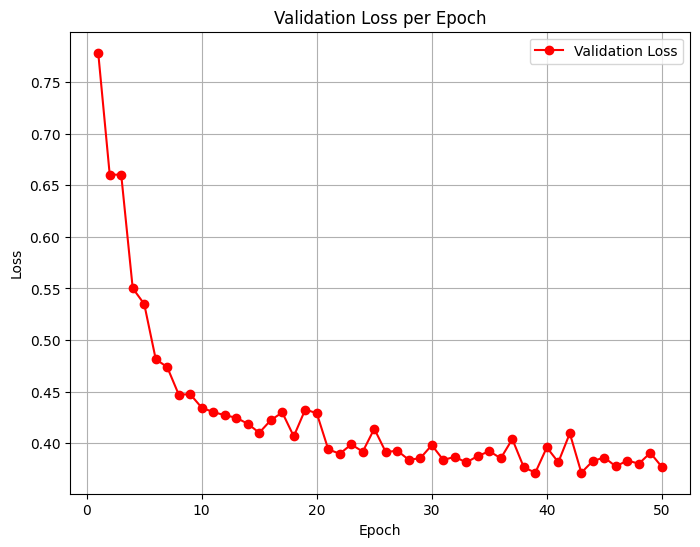

In [ ]:
import torch
import matplotlib.pyplot as plt
import glob
ckpt_dir='./runs/exp001/checkpoints/'
# read the checkpoint
ckpt_files = sorted(glob.glob(f"{ckpt_dir}/epoch_*.pt"))

epochs, val_losses = [], []

for f in ckpt_files:
    ckpt = torch.load(f, map_location="cpu")
    epochs.append(ckpt["epoch"])
    val_losses.append(ckpt["val_loss"])

# Plot
plt.figure(figsize=(8,6))
plt.plot(epochs, val_losses, marker='o', label="Validation Loss", color="red")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Validation Loss per Epoch")
plt.legend()
plt.grid(True)
plt.show()

Evaluate on test set

Using device: cpu
UNI model loaded from HF hub.
Visualizing predictions...
Sample 1: IoU=0.913, Dice=0.954, mAP=0.187


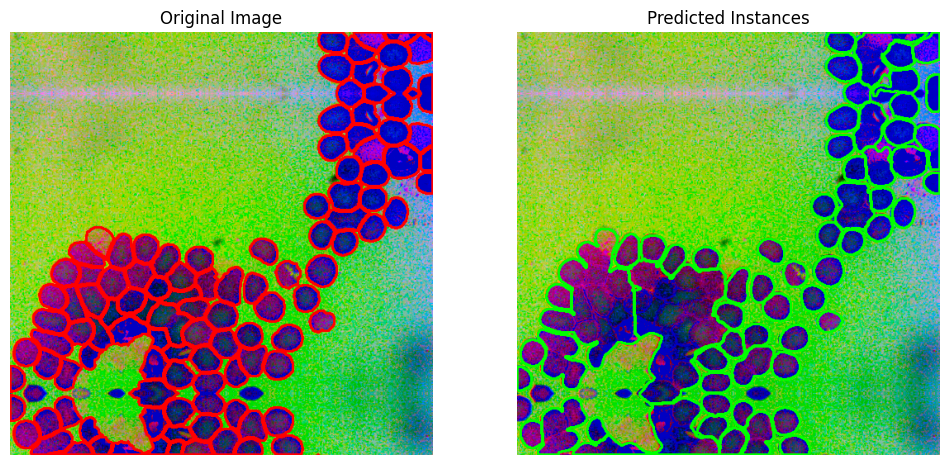

Sample 2: IoU=0.894, Dice=0.944, mAP=0.281


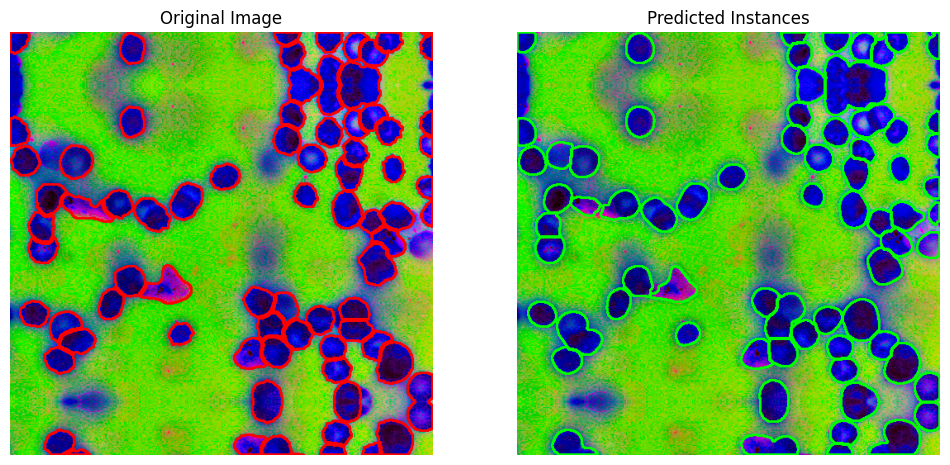

Sample 3: IoU=0.944, Dice=0.971, mAP=0.552


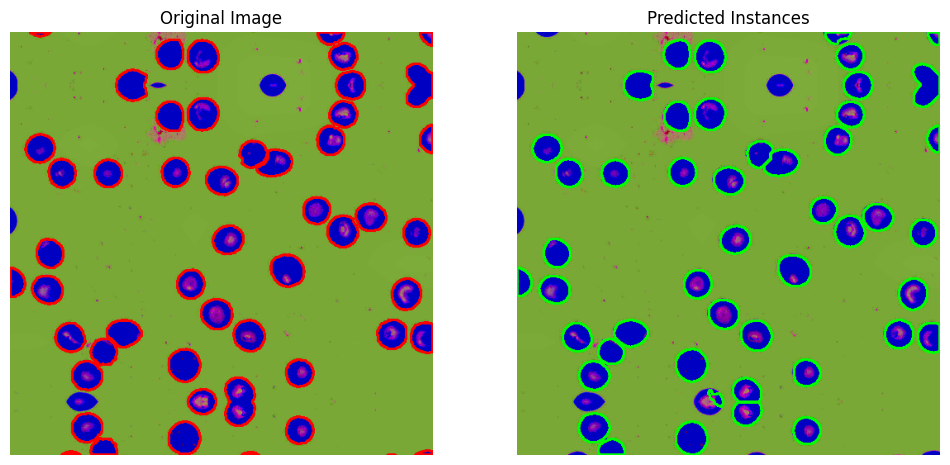

Sample 4: IoU=0.929, Dice=0.963, mAP=0.354


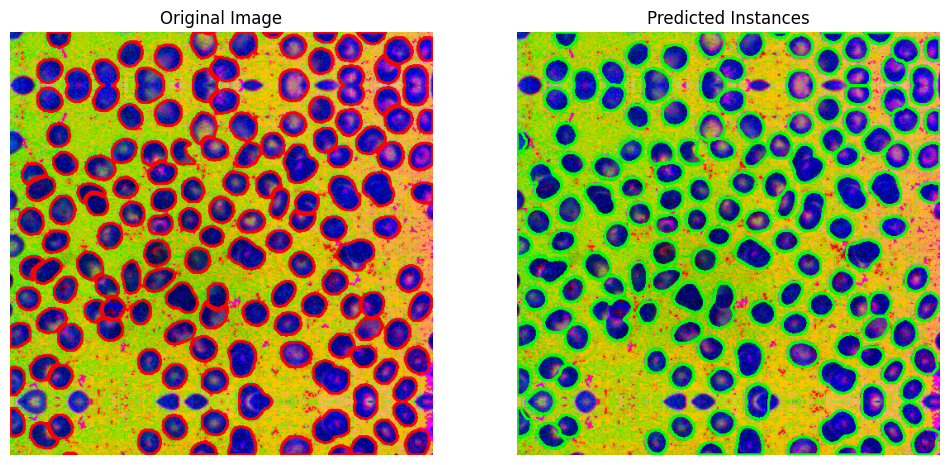

Sample 5: IoU=0.920, Dice=0.958, mAP=0.346


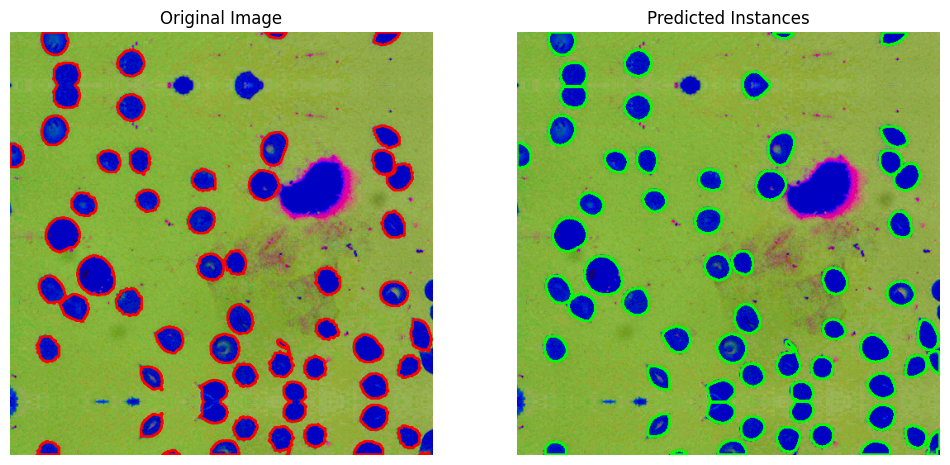

Sample 6: IoU=0.946, Dice=0.972, mAP=0.365


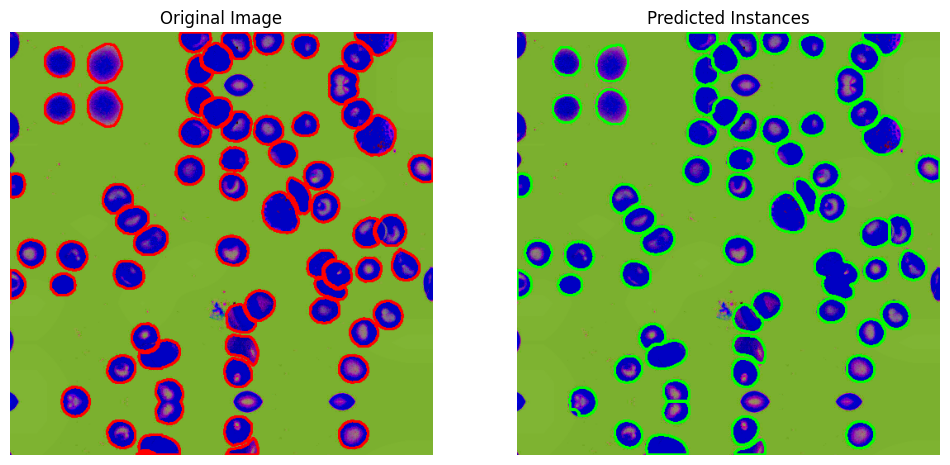

Sample 7: IoU=0.902, Dice=0.948, mAP=0.306


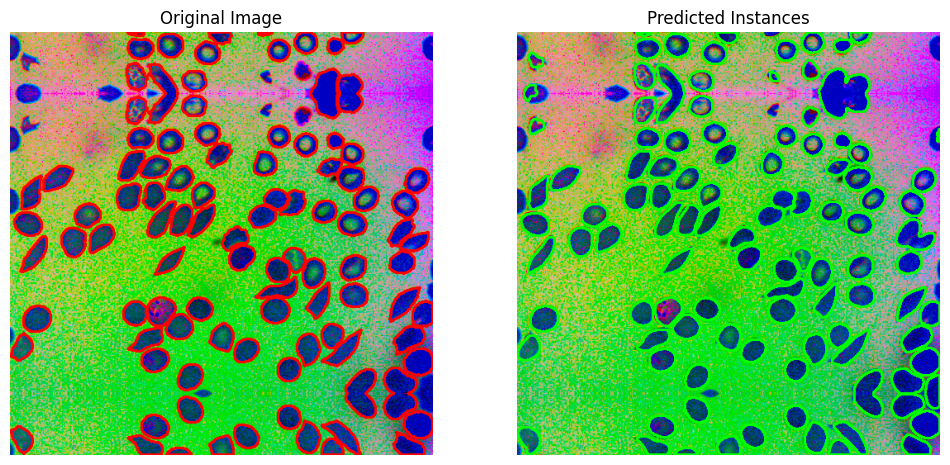

Sample 8: IoU=0.874, Dice=0.933, mAP=0.280


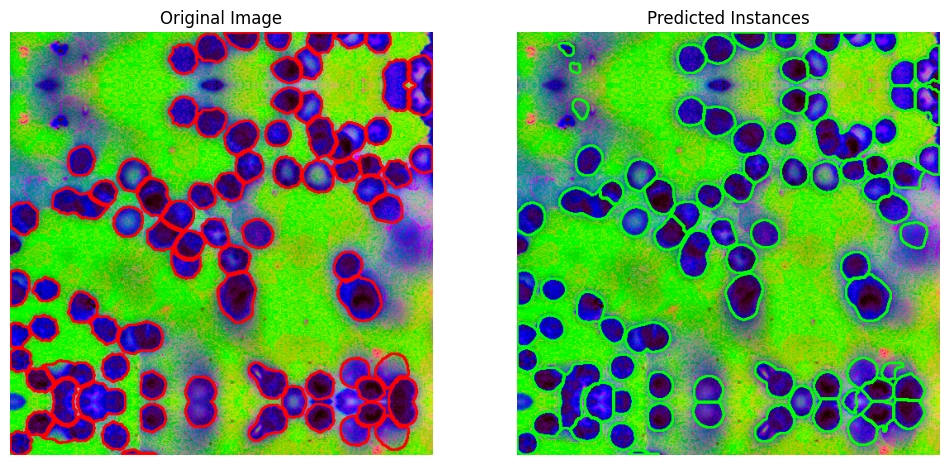

Sample 9: IoU=0.949, Dice=0.974, mAP=0.333


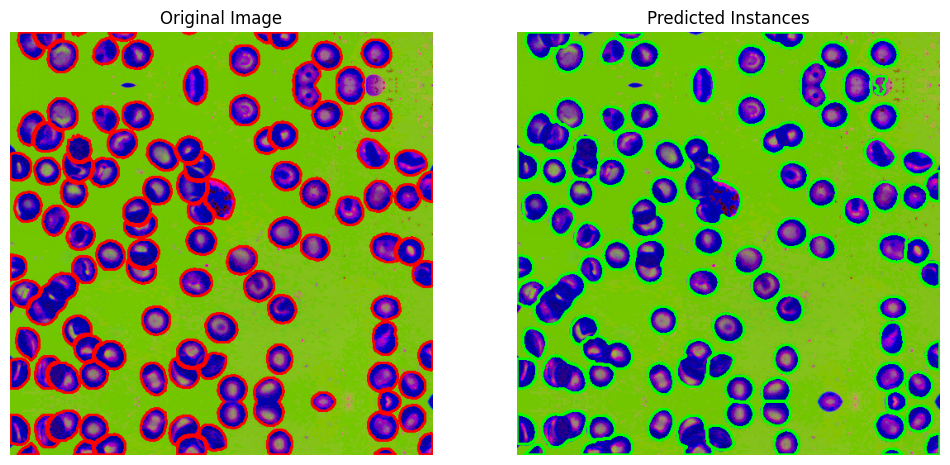

Sample 10: IoU=0.893, Dice=0.944, mAP=0.244


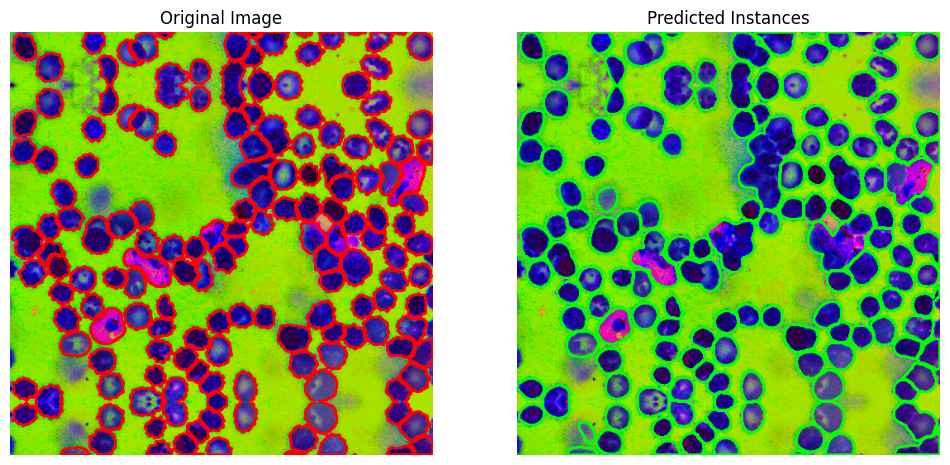

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2
from torch.utils.data import Dataset, DataLoader
from data.bccd import load_reference_lab, BCCDDataset
from utils.postprocess import pred_to_instances
from utils.visualize import overlay_instances, draw_tp_fp_fn

from models.uni_backbone import UNIBackbone
from models.segmentation_head import UNIInstSeg
from metrics import compute_iou_dice, compute_map_detail
def contours_only(img_rgb, inst, color=(0,255,0), thickness=2):
    vis = img_rgb.copy()
    for lab in range(1, int(inst.max())+1):
        cnts,_ = cv2.findContours((inst==lab).astype(np.uint8),
                                    cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(vis, cnts, -1, color, thickness)
    return vis
def visualize_predictions_with_metrics(model, dataloader, device, num_samples=5):
    """
    Visualize original image, predicted instances
    """
    model.eval()
    
    # Get a few samples
    samples_shown = 0
    
    for batch in dataloader:
        img = batch["image"][0].to(device)  # assume batch_size=1
        gt_inst = batch["gt_inst"][0].numpy().astype(np.int32)
        
        # Forward
        with torch.no_grad():
            out = model(img.unsqueeze(0))  # add batch dim
            cell = out["cell"][0, 0].cpu().numpy()
            boundary = out["boundary"][0, 0].cpu().numpy()
            center = out["center"][0, 0].cpu().numpy()
        
        # Convert predictions to instance map
        from utils.postprocess import pred_to_instances
        inst_map, scores = pred_to_instances(cell, boundary, center)
        
        pred_sem = (inst_map > 0).astype(np.uint8)
        gt_sem   = (gt_inst  > 0).astype(np.uint8)
        
        iou, dice = compute_iou_dice(pred_sem, gt_sem)
        map_detail = compute_map_detail(inst_map, scores, gt_inst)
        print(f"Sample {samples_shown+1}: IoU={iou:.3f}, Dice={dice:.3f}, mAP={map_detail['AP_mean']:.3f}")

        img_rgb = (img.cpu().numpy().transpose(1, 2, 0) * 255).astype(np.uint8)
        gt_only   = contours_only(img_rgb, gt_inst, color=(255,0,0))   # red = GT
        pred_only = contours_only(img_rgb, inst_map, color=(0,255,0))
        
        # Plot
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(gt_only)
        axes[0].set_title("Original Image")
        axes[0].axis("off")
   
        
        axes[1].imshow(pred_only)
        axes[1].set_title("Predicted Instances")
        axes[1].axis("off")
        
        plt.show()
        
        samples_shown += 1
        if samples_shown >= num_samples:
            break
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

reference_dir = os.path.join(data_root, "reference_lab.png")
ref_lab = load_reference_lab(reference_dir)
test_json = os.path.join(data_root, "splits", "test.json")
checkpoint_path = os.path.join(ckpt_dir, "best.pt")
ds = BCCDDataset(test_json, img_size=512, stain_norm="reinhard", reference_lab=ref_lab, augment="none")
test_loader = DataLoader(ds, batch_size=1, shuffle=False, num_workers=2)

# model
backbone = UNIBackbone(device=device, use_uni=True)
model = UNIInstSeg(backbone).to(device)
ckpt = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(ckpt["model"], strict=True)
model.eval()

print("Visualizing predictions...")
visualize_predictions_with_metrics(model, test_loader, device, num_samples=10)